In [41]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('project -15_Rainfall-weatherAUS.csv')

1. Problem Statement:
    
a) Design a predictive model with the use of machine learning algorithms to forecast whether or
not it will rain tomorrow.

In [42]:
df["RainTomorrow"].unique()

array(['No', 'Yes', nan], dtype=object)

In [43]:
df.shape

(8425, 23)

# EDA
1. Null/NaN

In [44]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [45]:
categorical_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] == "object":
        categorical_col.append(i)
print("Categorical Columns: ", categorical_col)
print("\n")
num_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical Columns: ", num_col)
print("\n")

Categorical Columns:  ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']




In [46]:
df["WindGustDir"]=df["WindGustDir"].fillna(df["WindGustDir"].mode()[0]) # Fill the nan values with mode as it is an object

In [47]:
df["WindDir9am"]=df["WindDir9am"].fillna(df["WindDir9am"].mode()[0]) # Fill the nan values with mode as it is an object

In [48]:
df["WindDir3pm"]=df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0]) # Fill the nan values with mode as it is an object

In [49]:
df["RainToday"]=df["RainToday"].fillna(df["RainToday"].mode()[0]) # Fill the nan values with mode as it is an object

In [50]:
df["RainTomorrow"]=df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0]) # Fill the nan values with mode as it is an object

In [51]:
df["MinTemp"]=df["MinTemp"].fillna((df["MinTemp"].median())) # Fill the nan values with median

In [52]:
df["MaxTemp"]=df["MaxTemp"].fillna((df["MaxTemp"].median())) # Fill the nan values with median

In [53]:
df["Rainfall"]=df["Rainfall"].fillna((df["Rainfall"].median())) # Fill the nan values with median

In [54]:
df["Evaporation"]=df["Evaporation"].fillna((df["Evaporation"].median())) # Fill the nan values with median

In [55]:
df["Sunshine"]=df["Sunshine"].fillna((df["Sunshine"].median())) # Fill the nan values with median

In [56]:
df["WindGustSpeed"]=df["WindGustSpeed"].fillna((df["WindGustSpeed"].median())) # Fill the nan values with median

In [57]:
df["WindSpeed9am"]=df["WindSpeed9am"].fillna((df["WindSpeed9am"].median())) # Fill the nan values with median

In [58]:
df["WindSpeed3pm"]=df["WindSpeed3pm"].fillna((df["WindSpeed3pm"].median())) # Fill the nan values with median

In [59]:
df["Humidity9am"]=df["Humidity9am"].fillna((df["Humidity9am"].median())) # Fill the nan values with median

In [60]:
df["Humidity3pm"]=df["Humidity3pm"].fillna((df["Humidity3pm"].median())) # Fill the nan values with median

In [61]:
df["Pressure9am"]=df["Pressure9am"].fillna((df["Pressure9am"].median())) # Fill the nan values with median

In [62]:
df["Pressure3pm"]=df["Pressure3pm"].fillna((df["Pressure3pm"].median())) # Fill the nan values with median

In [63]:
df["Cloud9am"]=df["Cloud9am"].fillna((df["Cloud9am"].median())) # Fill the nan values with median

In [64]:
df["Cloud3pm"]=df["Cloud3pm"].fillna((df["Cloud3pm"].median())) # Fill the nan values with median

In [65]:
df["Temp9am"]=df["Temp9am"].fillna((df["Temp9am"].median())) # Fill the nan values with median

In [66]:
df["Temp3pm"]=df["Temp3pm"].fillna((df["Temp3pm"].median())) # Fill the nan values with median

In [67]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [68]:
# Checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

Date
2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64


Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: count, dtype: int64


MinTemp
 13.3    139
 12.0     74
 13.2     71
 13.8     69
 12.7     68
        ... 
 0.3       1
 28.3      1
-1.1       1
-1.4       1
 26.0      1
Name: count, Length: 285, dtype: int64


MaxTemp
23.3    113
19.0     87
23.8     75
19.8     74
25.0     71
       ... 
11.2      1
43.1      1
42.7      1
42.9      1
43.5      1
Name: count, Length: 331, dtype: int64


Rainfall
0.0      5539
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0   

In [69]:
df.nunique().to_frame("No of unique values")

,No of unique values
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


# 2. Label Encoder

In [70]:
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))
        

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   float64
 1   Location       8425 non-null   float64
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   Evaporation    8425 non-null   float64
 6   Sunshine       8425 non-null   float64
 7   WindGustDir    8425 non-null   float64
 8   WindGustSpeed  8425 non-null   float64
 9   WindDir9am     8425 non-null   float64
 10  WindDir3pm     8425 non-null   float64
 11  WindSpeed9am   8425 non-null   float64
 12  WindSpeed3pm   8425 non-null   float64
 13  Humidity9am    8425 non-null   float64
 14  Humidity3pm    8425 non-null   float64
 15  Pressure9am    8425 non-null   float64
 16  Pressure3pm    8425 non-null   float64
 17  Cloud9am       8425 non-null   float64
 18  Cloud3pm

# 3. Skewness, Outliars (We donot remove Skewness and Outliars from categorial columns

In [32]:
df.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,1296.570564,5.793591,13.194255,23.855988,2.725982,5.060332,8.138409,7.217804,40.036320,7.267418,...,67.823739,51.246766,1017.649519,1015.246030,4.691157,4.647953,17.762267,22.436748,0.236202,0.236320
std,854.249434,3.162654,5.379497,6.114697,10.319872,3.871619,2.875324,4.702616,13.781296,4.588045,...,16.774237,18.311914,6.275796,6.217494,2.437110,2.310476,5.608301,5.946128,0.424773,0.424846
min,0.000000,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,589.000000,3.000000,9.300000,19.300000,0.000000,4.000000,8.400000,3.000000,31.000000,3.000000,...,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000
50%,1088.000000,6.000000,13.300000,23.300000,0.000000,4.600000,8.700000,7.000000,39.000000,7.000000,...,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000,0.000000,0.000000
75%,2021.000000,8.000000,17.300000,28.000000,0.800000,5.200000,8.900000,12.000000,48.000000,12.000000,...,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000
max,3003.000000,11.000000,28.500000,45.500000,371.000000,145.000000,13.900000,15.000000,107.000000,15.000000,...,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


# - Note 2: Observations:
- Column count is same: No missing data
- There is no negative/valid _ Dataset is OK
- Median (50%) > Mean - --> Left Skewed
- Median (50%) < Mean - "Date","Rainfall","WindGustSpeed","Evaporation"-> Right Skewed
- Standard Dev for "Date","Humidity9am","Humidity3pm" is high -> Outliars are present
- Percentile 75% and max : It is there in "MinTemp","MaxTemp","Rainfall","Evaporation","Sunshine","WindGustDir","WindGustSpeed","WindDir9am","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm" -> outliars are present

In [33]:
df.skew()

Date              0.386560
Location         -0.050456
MinTemp          -0.090519
MaxTemp           0.382572
Rainfall         13.200523
Evaporation      14.064000
Sunshine         -1.189333
WindGustDir       0.119640
WindGustSpeed     0.786153
WindDir9am        0.172792
WindDir3pm       -0.119847
WindSpeed9am      0.962761
WindSpeed3pm      0.492365
Humidity9am      -0.256965
Humidity3pm       0.118776
Pressure9am      -0.028521
Pressure3pm      -0.015018
Cloud9am         -0.514801
Cloud3pm         -0.457713
Temp9am          -0.014883
Temp3pm           0.400388
RainToday         1.242362
RainTomorrow      1.241588
dtype: float64

Rainfall and Evaporation is skewed

In [34]:
x = ['Rainfall' ,'Evaporation']

for i in x:
    df[i] = np.cbrt(df[i])   # Remove Skewness

In [35]:
df.skew()

Date             0.386560
Location        -0.050456
MinTemp         -0.090519
MaxTemp          0.382572
Rainfall         1.762561
Evaporation      0.538627
Sunshine        -1.189333
WindGustDir      0.119640
WindGustSpeed    0.786153
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.962761
WindSpeed3pm     0.492365
Humidity9am     -0.256965
Humidity3pm      0.118776
Pressure9am     -0.028521
Pressure3pm     -0.015018
Cloud9am        -0.514801
Cloud3pm        -0.457713
Temp9am         -0.014883
Temp3pm          0.400388
RainToday        1.242362
RainTomorrow     1.241588
dtype: float64

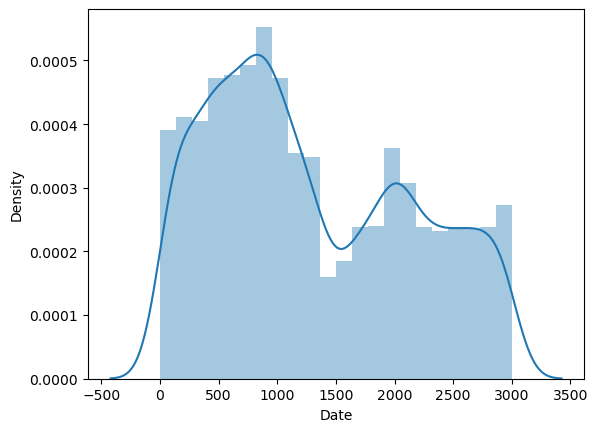

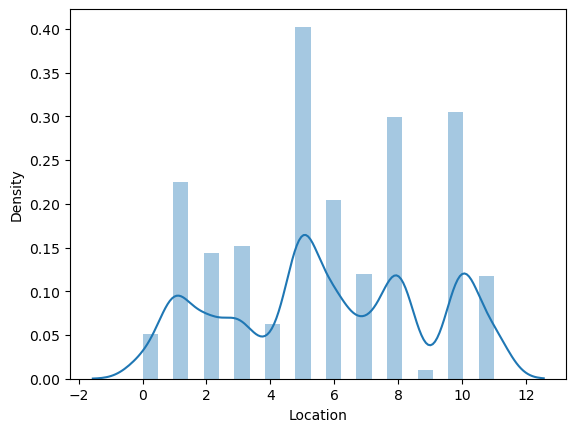

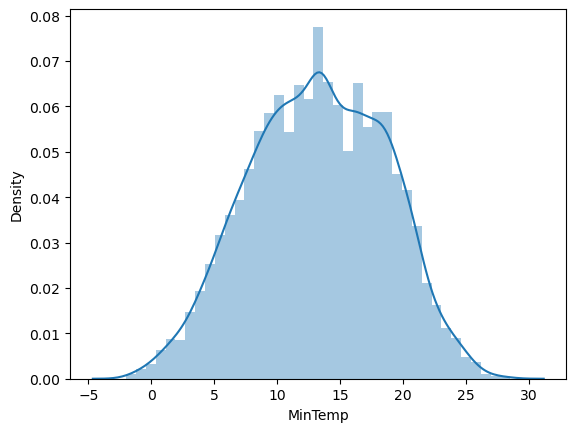

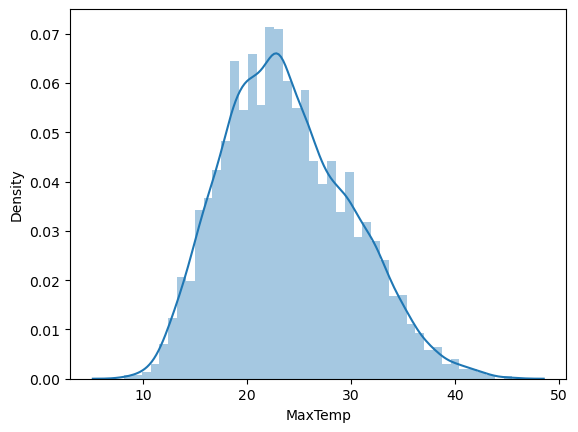

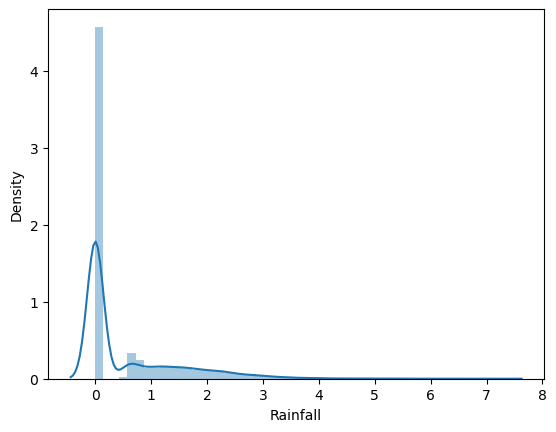

...

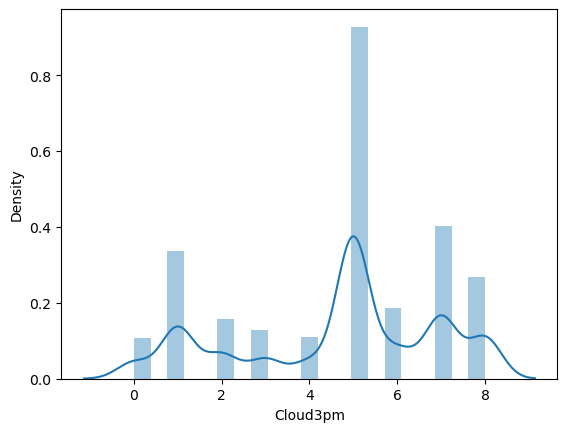

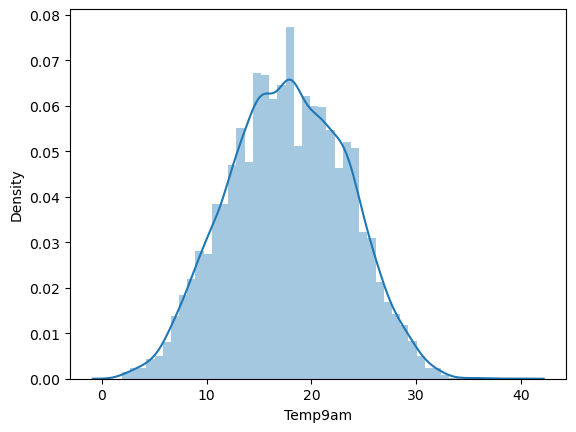

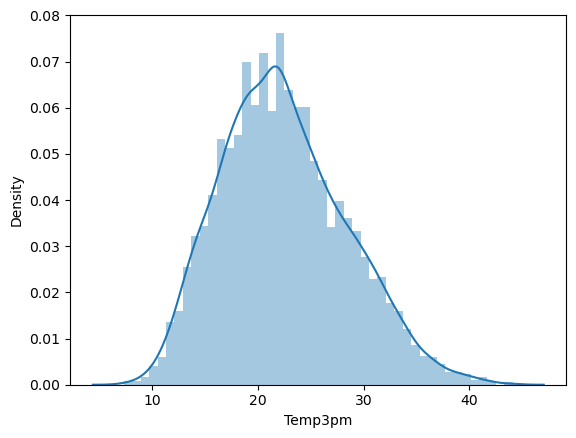

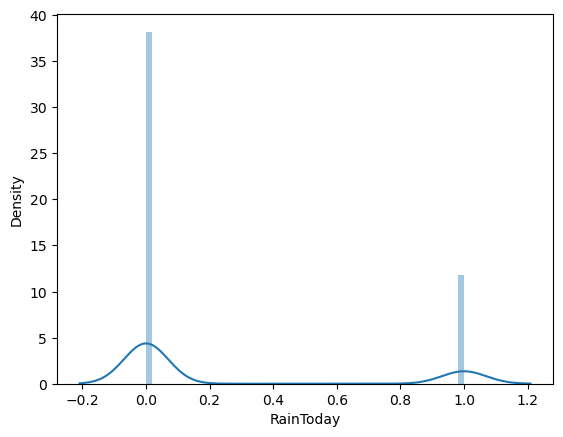

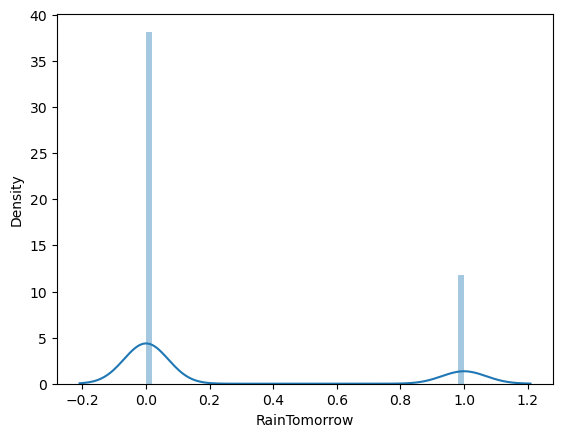

In [36]:
for i in df.columns: # Skewness
    plt.figure()
    sns.distplot(df[i])

Date                Axes(0.125,0.825775;0.168478x0.0542254)
Location         Axes(0.327174,0.825775;0.168478x0.0542254)
MinTemp          Axes(0.529348,0.825775;0.168478x0.0542254)
MaxTemp          Axes(0.731522,0.825775;0.168478x0.0542254)
Rainfall            Axes(0.125,0.760704;0.168478x0.0542254)
Evaporation      Axes(0.327174,0.760704;0.168478x0.0542254)
Sunshine         Axes(0.529348,0.760704;0.168478x0.0542254)
WindGustDir      Axes(0.731522,0.760704;0.168478x0.0542254)
WindGustSpeed       Axes(0.125,0.695634;0.168478x0.0542254)
WindDir9am       Axes(0.327174,0.695634;0.168478x0.0542254)
WindDir3pm       Axes(0.529348,0.695634;0.168478x0.0542254)
WindSpeed9am     Axes(0.731522,0.695634;0.168478x0.0542254)
WindSpeed3pm        Axes(0.125,0.630563;0.168478x0.0542254)
Humidity9am      Axes(0.327174,0.630563;0.168478x0.0542254)
Humidity3pm      Axes(0.529348,0.630563;0.168478x0.0542254)
Pressure9am      Axes(0.731522,0.630563;0.168478x0.0542254)
Pressure3pm         Axes(0.125,0.565493;

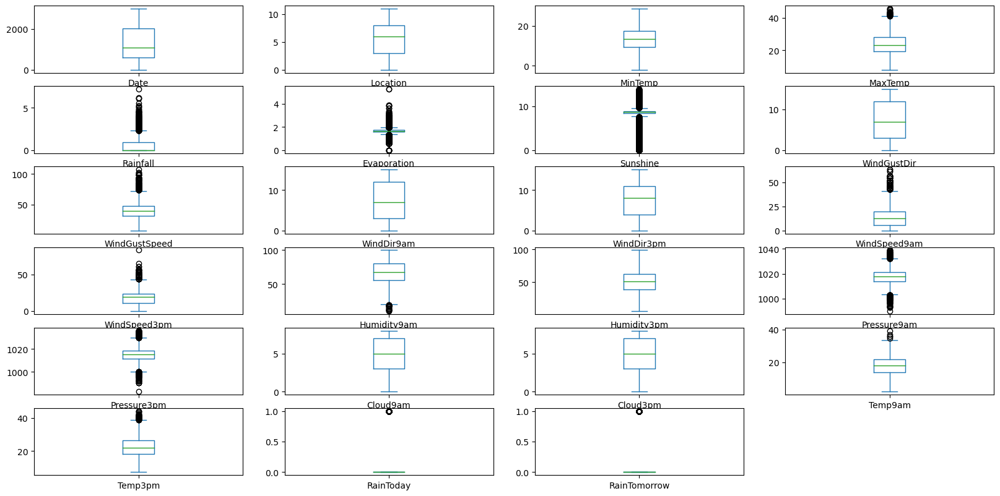

In [37]:
df.plot(kind='box',subplots=True,layout=(12,4),figsize=(20,20))

Note 3: Observations:   

MaxTemp,Evaporation,Sunshine ,WindGustDir, WindGustSpeed ,WindSpeed9am ,WindSpeed3pm,Humidity9am ,Pressure9am,Pressure3pm,Temp9am,Temp3pm has major outliares.        



# Remove Outliers

In [38]:
from scipy.stats import zscore
ol = ['MaxTemp','Evaporation','Sunshine' ,'WindGustDir', 'WindGustSpeed','WindSpeed9am' ,'WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm' ]
x_x=0
for i in ol:
    y_y=0
    col = df[i]
    z=zscore(col)
    thresh =3
    df1 = df[(z < thresh) & (z > -thresh)]
    y_y = df.shape[0]-df1.shape[0]
    x_x= x_x + y_y

print("Data loss rate",(x_x/df.shape[0])*100)

Data loss rate 5.5905044510385755


# 4. Co- Relation and Multicolinearity

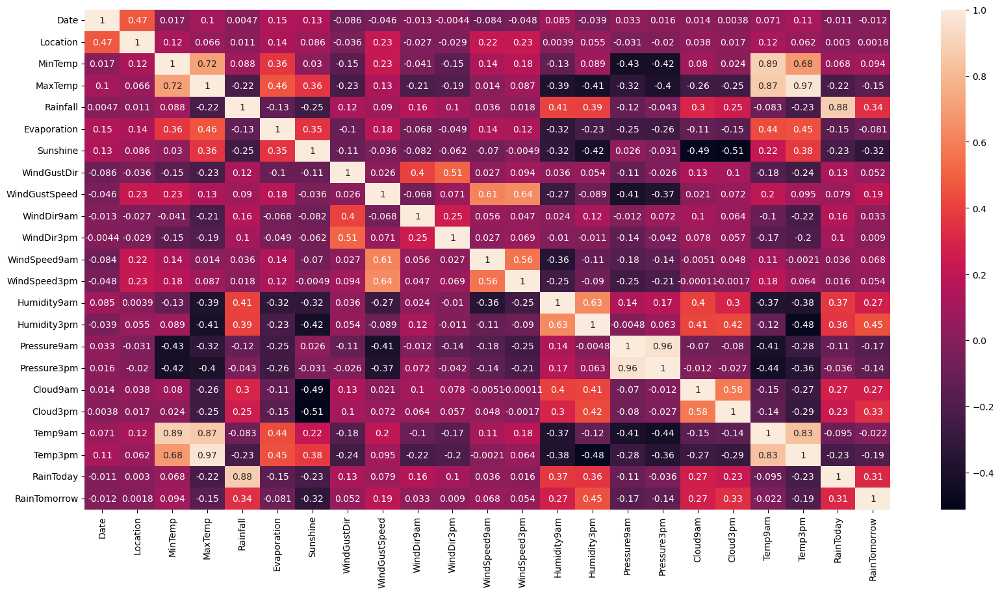

In [39]:
corr_hmap=df1.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr_hmap,annot=True)
plt.show()

In [40]:
df.columns


Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [ ]:
- Near to Zero : No Corelation- Low Corelation Worst - "MinTemp', 'MaxTemp",'Pressure9am', 'Pressure3pm','Temp9am',
       'Temp3pm'
- 0.3 or >-0.3 --> "Rainfall","RainToday","Cloud3pm","Education_num","Capital_gain"
- 0.5 or >-0.5 --> Mod Corelation -"Humidity3pm"
- 0.7 or >-0.7 --> High Corelation 

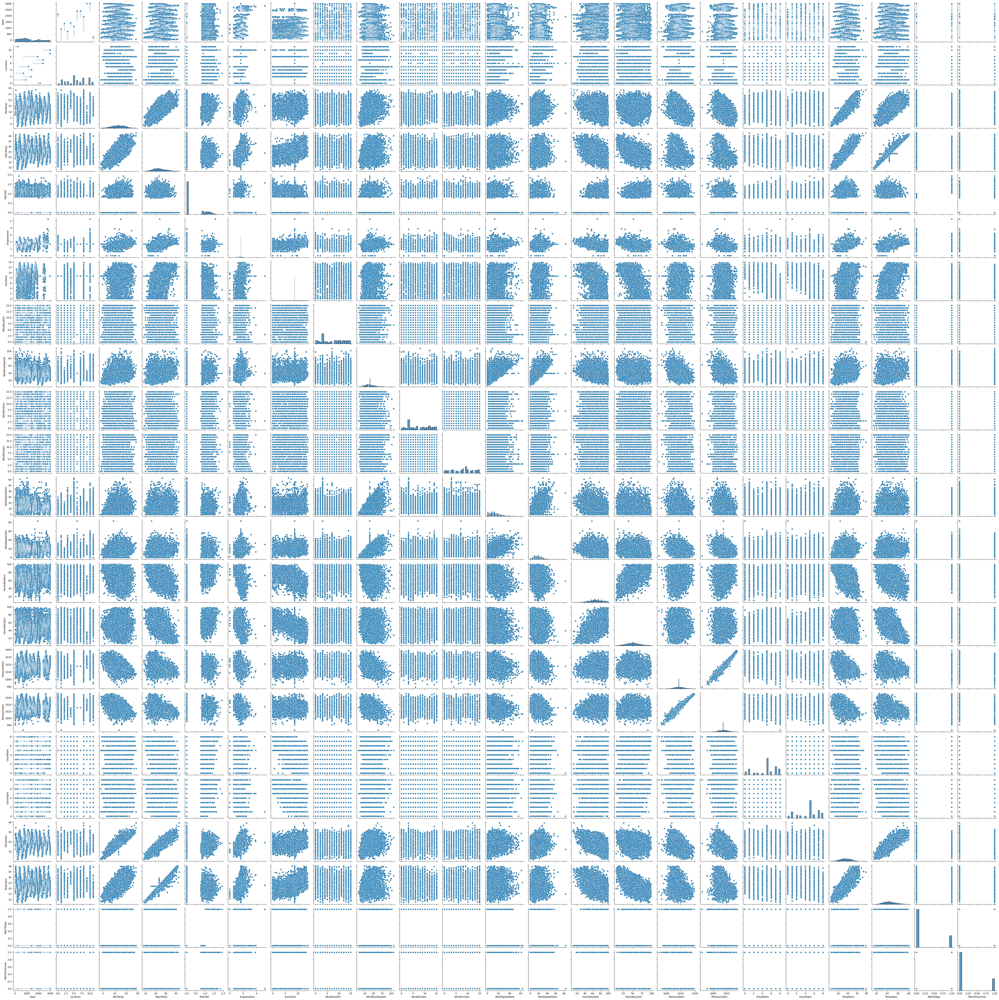

In [48]:
sns.pairplot(df1)

In [166]:
df.columns

Index(['Date', 'Location', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Cloud9am', 'Cloud3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [167]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x=df.iloc[:,0:-1]
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

    VIF Factor       features
0     4.762399           Date
1     6.612015       Location
2     6.246092       Rainfall
3    66.671520    Evaporation
4    15.922852       Sunshine
5     5.202768    WindGustDir
6    20.149416  WindGustSpeed
7     4.458378     WindDir9am
8     5.617189     WindDir3pm
9     5.577989   WindSpeed9am
10    8.834710   WindSpeed3pm
11   33.685362    Humidity9am
12   18.170781    Humidity3pm
13    8.450627       Cloud9am
14    8.827526       Cloud3pm
15    5.087134      RainToday


In [168]:
columns_to_drop=['Pressure9am','Pressure3pm','Temp9am','Temp3pm','MinTemp','MaxTemp'] # Least co-relation with output and high multicollinearity
df = df.drop(columns_to_drop, axis=1)
df

,Date,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,0.0,1.0,0.843433,1.663103,8.7,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,8.0,5.0,0.0,0.0
1,1.0,1.0,0.000000,1.663103,8.7,14.0,44.0,6.0,15.0,4.0,22.0,44.0,25.0,5.0,5.0,0.0,0.0
2,2.0,1.0,0.000000,1.663103,8.7,15.0,46.0,13.0,15.0,19.0,26.0,38.0,30.0,5.0,2.0,0.0,0.0
3,3.0,1.0,0.000000,1.663103,8.7,4.0,24.0,9.0,0.0,11.0,9.0,45.0,16.0,5.0,5.0,0.0,0.0
4,4.0,1.0,1.000000,1.663103,8.7,13.0,41.0,1.0,7.0,7.0,20.0,82.0,33.0,7.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,0.000000,1.663103,8.7,0.0,31.0,9.0,1.0,13.0,11.0,51.0,24.0,5.0,5.0,0.0,0.0
8421,3000.0,9.0,0.000000,1.663103,8.7,6.0,22.0,9.0,3.0,13.0,9.0,56.0,21.0,5.0,5.0,0.0,0.0
8422,3001.0,9.0,0.000000,1.663103,8.7,3.0,37.0,9.0,14.0,9.0,9.0,53.0,24.0,5.0,5.0,0.0,0.0
8423,3002.0,9.0,0.000000,1.663103,8.7,9.0,28.0,10.0,3.0,13.0,7.0,51.0,24.0,3.0,2.0,0.0,0.0


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x=df.iloc[:,0:-1]
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

# MODEL
Feature Scaling using Standard Scalarization

In [53]:
y=df["RainTomorrow"]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Date,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday
0,-1.517879,-1.515776,1.019718,0.019819,0.195325,1.229643,0.287630,1.249535,1.397222,0.608197,0.562679,0.189365,-1.597239,1.357772,0.152379,-0.556099
1,-1.516709,-1.515776,-0.704597,0.019819,0.195325,1.442303,0.287630,-0.276260,1.622961,-0.971536,0.356585,-1.420342,-1.433401,0.126733,0.152379,-0.556099
2,-1.515538,-1.515776,-0.704597,0.019819,0.195325,1.654964,0.432763,1.249535,1.622961,0.509464,0.768772,-1.778055,-1.160339,0.126733,-1.146132,-0.556099
3,-1.514367,-1.515776,-0.704597,0.019819,0.195325,-0.684299,-1.163698,0.377652,-1.763120,-0.280403,-0.983024,-1.360723,-1.924914,0.126733,0.152379,-0.556099
4,-1.513197,-1.515776,1.120419,0.019819,0.195325,1.229643,0.069931,-1.366114,-0.182949,-0.675336,0.150491,0.845171,-0.996501,0.947425,1.450890,-0.556099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.993013,1.013895,-0.704597,0.019819,0.195325,-1.534940,-0.655733,0.377652,-1.537381,-0.082936,-0.776930,-1.003011,-1.488014,0.126733,0.152379,-0.556099
8421,1.994184,1.013895,-0.704597,0.019819,0.195325,-0.258979,-1.308831,0.377652,-1.085904,-0.082936,-0.983024,-0.704917,-1.651851,0.126733,0.152379,-0.556099
8422,1.995355,1.013895,-0.704597,0.019819,0.195325,-0.896959,-0.220335,0.377652,1.397222,-0.477869,-0.983024,-0.883773,-1.488014,0.126733,0.152379,-0.556099
8423,1.996525,1.013895,-0.704597,0.019819,0.195325,0.379002,-0.873433,0.595623,-1.085904,-0.082936,-1.189118,-1.003011,-1.488014,-0.693960,-1.146132,-0.556099


# 2. OverSampling

In [54]:
y.value_counts()

0.0    6434
1.0    1991
Name: RainTomorrow, dtype: int64

In [55]:
import imblearn
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1=SM.fit_resample(x,y)

In [56]:
y1.value_counts()

0.0    6434
1.0    6434
Name: RainTomorrow, dtype: int64

# 3. Best random state value:

In [57]:
y1.unique()

array([0., 1.])

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score



maxAccu=0
maxRS=0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc > maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," at random state ", maxRS)

Best accuracy is 0.9383579383579383  at random state  70


# 4. Creating train test split

In [59]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=maxRS)

# 5. Classification Algorithms and Cross Validation Score

In [60]:
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
rfc=RandomForestClassifier()
etc=ExtraTreesClassifier()
lg=LogisticRegression()
svc=SVC(kernel = "linear")
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
bc=BaggingClassifier()
gnb=GaussianNB()
knn = KNeighborsClassifier(n_neighbors=5)
dtc = DecisionTreeClassifier(criterion = "gini")



model=[rfc,etc,lg,svc,gbc,abc,bc,gnb,knn,dtc]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy Score of:  ",m," is " )
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print("\n")
    score = cross_val_score(m,x1,y1)
    print("Cross Validation of:  ",m," is " )
    print(score)
    print(score.mean())
    print("Diff in Acc Score and Cross Val Score is - ",accuracy_score(y_test,predm)-score.mean())
    print("\n")

Accuracy Score of:   RandomForestClassifier()  is 
0.9347319347319347
[[1804  133]
 [ 119 1805]]
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.93      1937
         1.0       0.93      0.94      0.93      1924

    accuracy                           0.93      3861
   macro avg       0.93      0.93      0.93      3861
weighted avg       0.93      0.93      0.93      3861



Cross Validation of:   RandomForestClassifier()  is 
[0.5982906  0.65578866 0.89355089 0.86941314 0.76214536]
0.7558377279325589
Diff in Acc Score and Cross Val Score is -  0.17889420679937584


Accuracy Score of:   ExtraTreesClassifier()  is 
0.9453509453509453
[[1808  129]
 [  82 1842]]
              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94      1937
         1.0       0.93      0.96      0.95      1924

    accuracy                           0.95      3861
   macro avg       0.95      0.95      0.95      3861
weighted avg


Best Model is : ExtraTreesClassifier

# 6. Hyper Parameter Tuning

In [67]:
from sklearn.model_selection import GridSearchCV
parameters = {"criterion" : ["gini", "entropy", "log_loss"],
             "random_state" :[maxRS],
             "max_depth": [0,10,20],
             "n_jobs": [-2,-1,1],
             "n_estimators":[50,100,200,300],
             "class_weight": ["balanced", "balanced_subsample"],
             "max_features": ["sqrt","log2","None"]}

In [68]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameters,cv=7)

In [69]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=7, estimator=ExtraTreesClassifier(),
             param_grid={'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1], 'random_state': [70]})

In [70]:
GCV.best_params_

{'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 70}

In [71]:
etc_bp = ExtraTreesClassifier(criterion="gini",random_state=70,max_features="sqrt",max_depth=20, class_weight="balanced",n_estimators=300,n_jobs=-2)
etc_bp.fit(x_train,y_train)
pred=etc_bp.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.91349391349392


# 8. Saving the Model

In [73]:
import joblib # save as *.pkl
joblib.dump(etc_bp,"project -15_Rainfall-weatherAUS.pkl")

['project -15_Rainfall-weatherAUS.pkl']

# 2. Problem Statement: 
    
   b)  Design a predictive model with the use of machine learning algorithms to predict how much
       rainfall could be there.

In [172]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('project -15_Rainfall-weatherAUS.csv')

In [173]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [174]:
df["Rainfall"].unique()

array([6.000e-01, 0.000e+00, 1.000e+00, 2.000e-01, 1.400e+00, 2.200e+00,
       1.560e+01, 3.600e+00,       nan, 1.680e+01, 1.060e+01, 1.200e+00,
       8.000e-01, 6.400e+00, 4.000e-01, 3.000e+00, 5.800e+00, 1.160e+01,
       1.800e+00, 8.600e+00, 1.260e+01, 8.400e+00, 6.200e+00, 2.000e+01,
       2.100e+01, 3.200e+00, 4.800e+00, 4.200e+00, 8.000e+00, 1.440e+01,
       4.600e+00, 2.000e+00, 5.600e+00, 1.600e+00, 6.000e+00, 4.400e+00,
       5.400e+00, 5.000e+00, 7.800e+00, 6.800e+00, 9.800e+00, 3.800e+00,
       2.400e+00, 5.200e+00, 6.600e+00, 1.340e+01, 1.020e+01, 2.880e+01,
       7.000e+00, 2.580e+01, 9.400e+00, 1.240e+01, 5.220e+01, 2.060e+01,
       6.600e+01, 1.100e+01, 1.700e+01, 1.040e+01, 2.800e+01, 2.140e+01,
       1.860e+01, 7.200e+00, 8.200e+00, 1.080e+01, 1.540e+01, 9.600e+00,
       4.000e+00, 2.180e+01, 2.080e+01, 2.480e+01, 1.000e+01, 1.140e+01,
       1.900e+01, 2.220e+01, 3.280e+01, 3.400e+00, 5.080e+01, 5.260e+01,
       1.920e+01, 1.880e+01, 1.480e+01, 1.200e+01, 

In [175]:
df.shape

(8425, 23)

# EDA
Null/NaN

In [176]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [177]:
categorical_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] == "object":
        categorical_col.append(i)
print("Categorical Columns: ", categorical_col)
print("\n")
num_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical Columns: ", num_col)
print("\n")

Categorical Columns:  ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']




In [178]:
df["WindGustDir"]=df["WindGustDir"].fillna(df["WindGustDir"].mode()[0]) # Fill the nan values with mode as it is an object

In [179]:
df["WindDir9am"]=df["WindDir9am"].fillna(df["WindDir9am"].mode()[0]) # Fill the nan values with mode as it is an object

In [180]:
df["WindDir3pm"]=df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0]) # Fill the nan values with mode as it is an object

In [181]:
df["RainToday"]=df["RainToday"].fillna(df["RainToday"].mode()[0]) # Fill the nan values with mode as it is an object

In [182]:
df["RainTomorrow"]=df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0]) # Fill the nan values with mode as it is an object

In [183]:
df["MinTemp"]=df["MinTemp"].fillna((df["MinTemp"].median())) # Fill the nan values with median

In [184]:
df["MaxTemp"]=df["MaxTemp"].fillna((df["MaxTemp"].median())) # Fill the nan values with median

In [185]:
df["Rainfall"]=df["Rainfall"].fillna((df["Rainfall"].median())) # Fill the nan values with median

In [186]:
df["Evaporation"]=df["Evaporation"].fillna((df["Evaporation"].median())) # Fill the nan values with median

In [187]:
df["Sunshine"]=df["Sunshine"].fillna((df["Sunshine"].median())) # Fill the nan values with median

In [188]:
df["WindGustSpeed"]=df["WindGustSpeed"].fillna((df["WindGustSpeed"].median())) # Fill the nan values with median

In [189]:
df["WindSpeed9am"]=df["WindSpeed9am"].fillna((df["WindSpeed9am"].median())) # Fill the nan values with median

In [190]:
df["WindSpeed3pm"]=df["WindSpeed3pm"].fillna((df["WindSpeed3pm"].median())) # Fill the nan values with median

In [191]:
df["Humidity9am"]=df["Humidity9am"].fillna((df["Humidity9am"].median())) # Fill the nan values with median

In [192]:
df["Humidity3pm"]=df["Humidity3pm"].fillna((df["Humidity3pm"].median())) # Fill the nan values with median

In [193]:
df["Pressure9am"]=df["Pressure9am"].fillna((df["Pressure9am"].median())) # Fill the nan values with median

In [194]:
df["Pressure3pm"]=df["Pressure3pm"].fillna((df["Pressure3pm"].median())) # Fill the nan values with median

In [195]:
df["Cloud9am"]=df["Cloud9am"].fillna((df["Cloud9am"].median())) # Fill the nan values with median

In [196]:
df["Cloud3pm"]=df["Cloud3pm"].fillna((df["Cloud3pm"].median())) # Fill the nan values with median

In [197]:
df["Temp9am"]=df["Temp9am"].fillna((df["Temp9am"].median())) # Fill the nan values with median

In [198]:
df["Temp3pm"]=df["Temp3pm"].fillna((df["Temp3pm"].median())) # Fill the nan values with median

In [199]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [200]:
# Checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


 13.3    139
 12.0     74
 13.2     71
 13.8     69
 12.7     68
        ... 
 0.3       1
 28.3      1
-1.1       1
-1.4       1
 26.0      1
Name: MinTemp, Length: 285, dtype: int64


23.3    113
19.0     87
23.8     75
19.8     74
25.0     71
       ... 
11.2      1
43.1      1
42.7      1
42.9      1
43.5      1
Name: MaxTemp, Length: 331, dtype: int64


0.0      5539
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1

In [201]:
df.nunique().to_frame("No of unique values")

,No of unique values
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


# 2. Label Encoder

In [202]:
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))
        
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1.0,13.4,22.9,0.6,4.6,8.7,13.0,44.0,13.0,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0
1,1.0,1.0,7.4,25.1,0.0,4.6,8.7,14.0,44.0,6.0,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0
2,2.0,1.0,12.9,25.7,0.0,4.6,8.7,15.0,46.0,13.0,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0
3,3.0,1.0,9.2,28.0,0.0,4.6,8.7,4.0,24.0,9.0,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0
4,4.0,1.0,17.5,32.3,1.0,4.6,8.7,13.0,41.0,1.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,2.8,23.4,0.0,4.6,8.7,0.0,31.0,9.0,...,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0
8421,3000.0,9.0,3.6,25.3,0.0,4.6,8.7,6.0,22.0,9.0,...,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0
8422,3001.0,9.0,5.4,26.9,0.0,4.6,8.7,3.0,37.0,9.0,...,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0
8423,3002.0,9.0,7.8,27.0,0.0,4.6,8.7,9.0,28.0,10.0,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0


In [203]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [204]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   float64
 1   Location       8425 non-null   float64
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   Evaporation    8425 non-null   float64
 6   Sunshine       8425 non-null   float64
 7   WindGustDir    8425 non-null   float64
 8   WindGustSpeed  8425 non-null   float64
 9   WindDir9am     8425 non-null   float64
 10  WindDir3pm     8425 non-null   float64
 11  WindSpeed9am   8425 non-null   float64
 12  WindSpeed3pm   8425 non-null   float64
 13  Humidity9am    8425 non-null   float64
 14  Humidity3pm    8425 non-null   float64
 15  Pressure9am    8425 non-null   float64
 16  Pressure3pm    8425 non-null   float64
 17  Cloud9am       8425 non-null   float64
 18  Cloud3pm

# 3. Skewness, Outliars (We donot remove Skewness and Outliars from categorial columns)

In [205]:
df.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,1296.570564,5.793591,13.194255,23.855988,2.725982,5.060332,8.138409,7.217804,40.036320,7.267418,...,67.823739,51.246766,1017.649519,1015.246030,4.691157,4.647953,17.762267,22.436748,0.236202,0.236320
std,854.249434,3.162654,5.379497,6.114697,10.319872,3.871619,2.875324,4.702616,13.781296,4.588045,...,16.774237,18.311914,6.275796,6.217494,2.437110,2.310476,5.608301,5.946128,0.424773,0.424846
min,0.000000,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,589.000000,3.000000,9.300000,19.300000,0.000000,4.000000,8.400000,3.000000,31.000000,3.000000,...,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000
50%,1088.000000,6.000000,13.300000,23.300000,0.000000,4.600000,8.700000,7.000000,39.000000,7.000000,...,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000,0.000000,0.000000
75%,2021.000000,8.000000,17.300000,28.000000,0.800000,5.200000,8.900000,12.000000,48.000000,12.000000,...,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000
max,3003.000000,11.000000,28.500000,45.500000,371.000000,145.000000,13.900000,15.000000,107.000000,15.000000,...,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


- Note 2: Observations:
- Column count is same: No missing data
- There is no negative/valid _ Dataset is OK
- Median (50%) > Mean - --> Left Skewed
- Median (50%) < Mean - "Date","Rainfall","WindGustSpeed","Evaporation"-> Right Skewed
- Standard Dev for "Date","Humidity9am","Humidity3pm" is high -> Outliars are present
- Percentile 75% and max : It is there in "MinTemp","MaxTemp","Rainfall","Evaporation","Sunshine","WindGustDir","WindGustSpeed","WindDir9am","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm" -> outliars are present

In [206]:
df.skew()

Date              0.386560
Location         -0.050456
MinTemp          -0.090519
MaxTemp           0.382572
Rainfall         13.200523
Evaporation      14.064000
Sunshine         -1.189333
WindGustDir       0.119640
WindGustSpeed     0.786153
WindDir9am        0.172792
WindDir3pm       -0.119847
WindSpeed9am      0.962761
WindSpeed3pm      0.492365
Humidity9am      -0.256965
Humidity3pm       0.118776
Pressure9am      -0.028521
Pressure3pm      -0.015018
Cloud9am         -0.514801
Cloud3pm         -0.457713
Temp9am          -0.014883
Temp3pm           0.400388
RainToday         1.242362
RainTomorrow      1.241588
dtype: float64

Rainfall and Evaporation is skewed

In [207]:
x = ['Rainfall' ,'Evaporation']

for i in x:
    df[i] = np.cbrt(df[i])   # Remove Skewness

In [208]:
df.skew()

Date             0.386560
Location        -0.050456
MinTemp         -0.090519
MaxTemp          0.382572
Rainfall         1.762561
Evaporation      0.538627
Sunshine        -1.189333
WindGustDir      0.119640
WindGustSpeed    0.786153
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.962761
WindSpeed3pm     0.492365
Humidity9am     -0.256965
Humidity3pm      0.118776
Pressure9am     -0.028521
Pressure3pm     -0.015018
Cloud9am        -0.514801
Cloud3pm        -0.457713
Temp9am         -0.014883
Temp3pm          0.400388
RainToday        1.242362
RainTomorrow     1.241588
dtype: float64

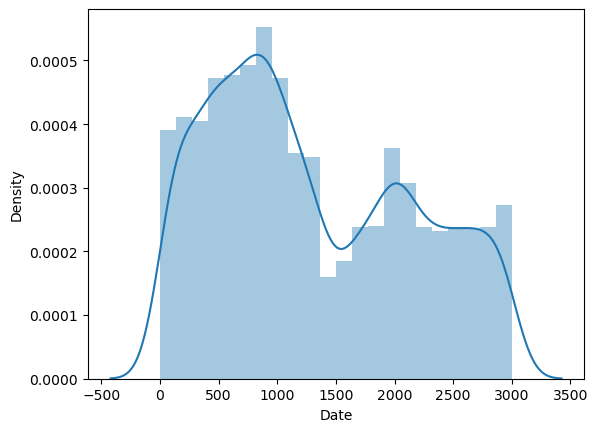

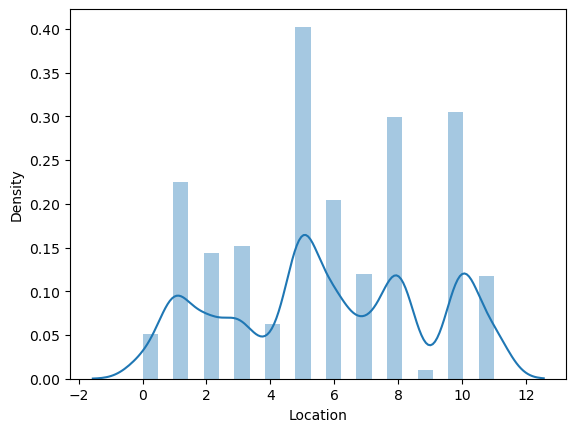

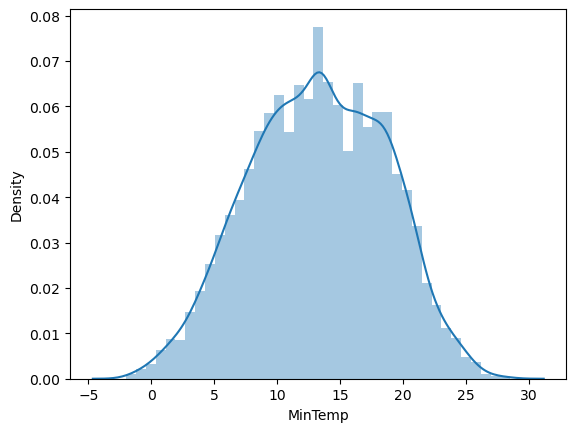

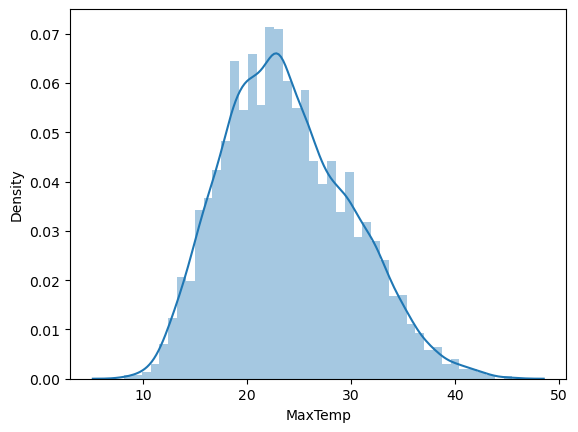

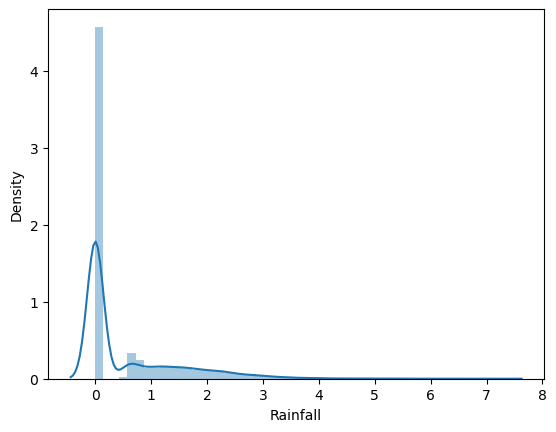

...

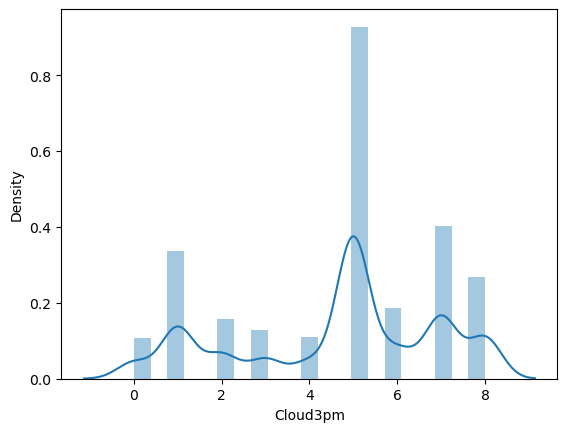

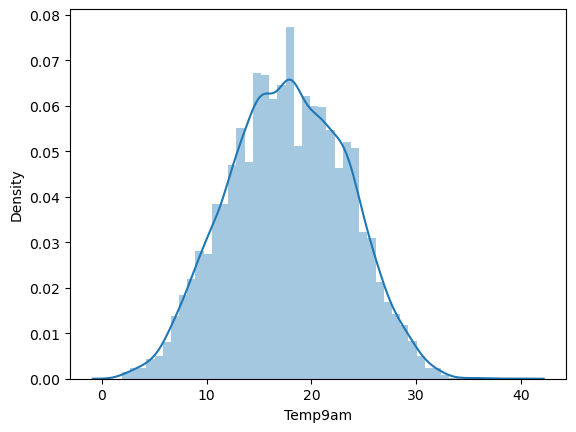

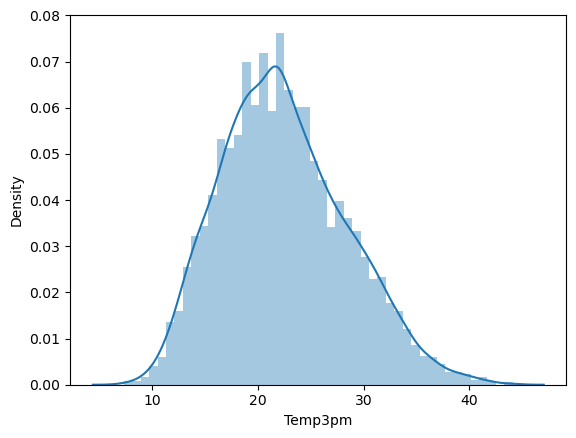

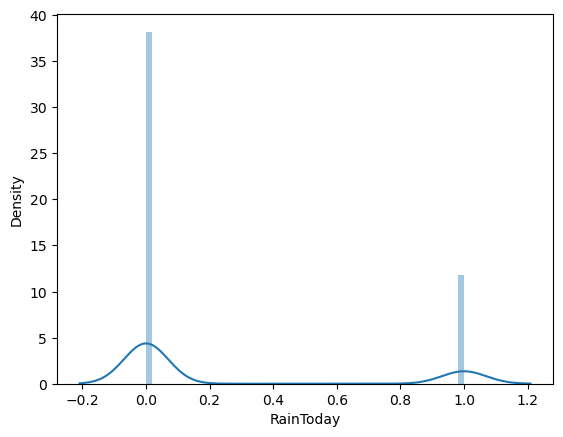

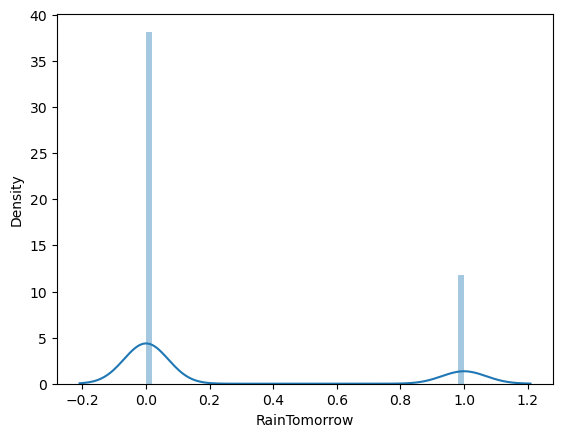

In [209]:
for i in df.columns: # Skewness
    plt.figure()
    sns.distplot(df[i])

Date                Axes(0.125,0.825775;0.168478x0.0542254)
Location         Axes(0.327174,0.825775;0.168478x0.0542254)
MinTemp          Axes(0.529348,0.825775;0.168478x0.0542254)
MaxTemp          Axes(0.731522,0.825775;0.168478x0.0542254)
Rainfall            Axes(0.125,0.760704;0.168478x0.0542254)
Evaporation      Axes(0.327174,0.760704;0.168478x0.0542254)
Sunshine         Axes(0.529348,0.760704;0.168478x0.0542254)
WindGustDir      Axes(0.731522,0.760704;0.168478x0.0542254)
WindGustSpeed       Axes(0.125,0.695634;0.168478x0.0542254)
WindDir9am       Axes(0.327174,0.695634;0.168478x0.0542254)
WindDir3pm       Axes(0.529348,0.695634;0.168478x0.0542254)
WindSpeed9am     Axes(0.731522,0.695634;0.168478x0.0542254)
WindSpeed3pm        Axes(0.125,0.630563;0.168478x0.0542254)
Humidity9am      Axes(0.327174,0.630563;0.168478x0.0542254)
Humidity3pm      Axes(0.529348,0.630563;0.168478x0.0542254)
Pressure9am      Axes(0.731522,0.630563;0.168478x0.0542254)
Pressure3pm         Axes(0.125,0.565493;

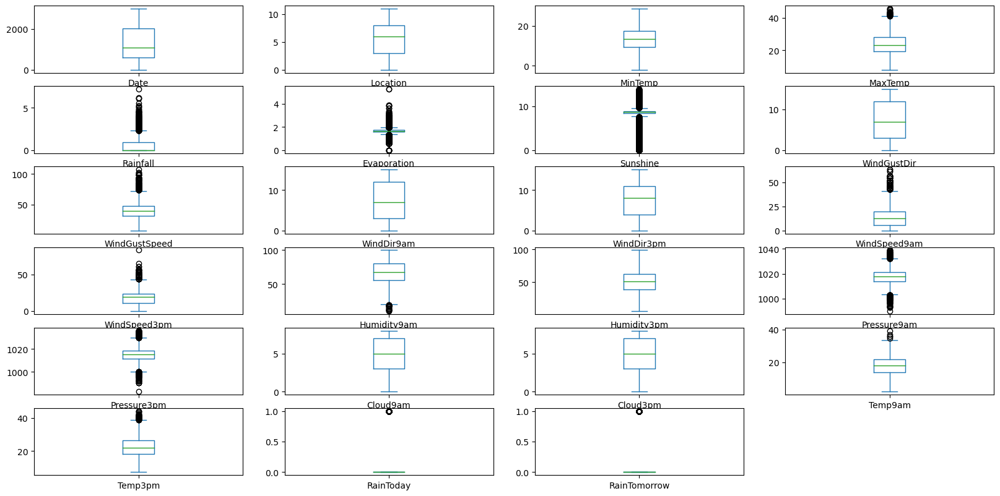

In [111]:
df.plot(kind='box',subplots=True,layout=(12,4),figsize=(20,20))

Note 3: Observations:

MaxTemp,Evaporation,Sunshine ,WindGustDir, WindGustSpeed ,WindSpeed9am ,WindSpeed3pm,Humidity9am ,Pressure9am,Pressure3pm,Temp9am,Temp3pm has major outliares.

# Remove Outliers

In [210]:
from scipy.stats import zscore
ol = ['MaxTemp','Evaporation','Sunshine' ,'WindGustDir', 'WindGustSpeed','WindSpeed9am' ,'WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm' ]
x_x=0
for i in ol:
    y_y=0
    col = df[i]
    z=zscore(col)
    thresh =3
    df1 = df[(z < thresh) & (z > -thresh)]
    y_y = df.shape[0]-df1.shape[0]
    x_x= x_x + y_y

print("Data loss rate",(x_x/df.shape[0])*100)

Data loss rate 5.5905044510385755


# 4. Co- Relation and Multicolinearity

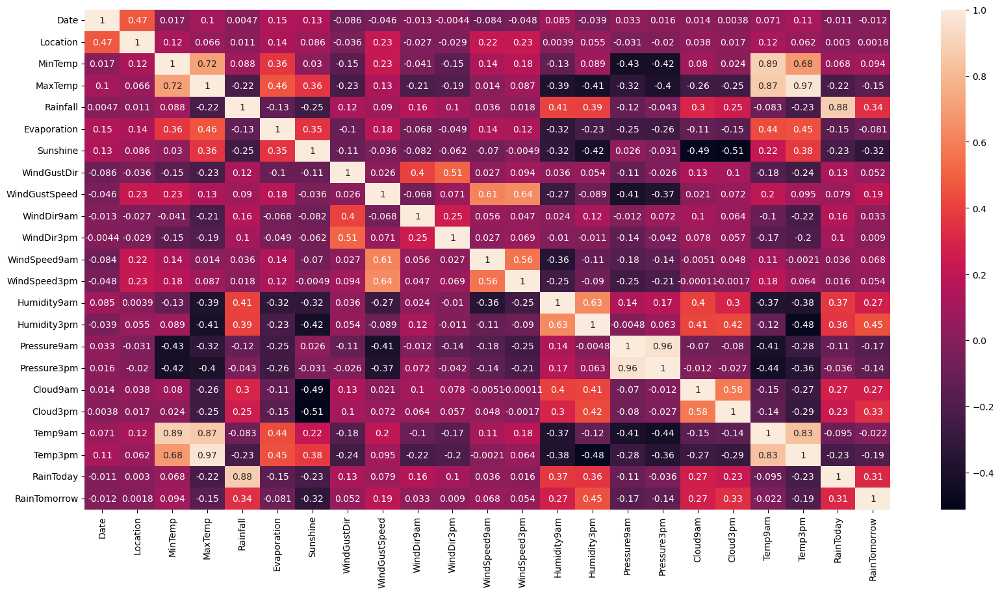

In [113]:
corr_hmap=df1.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr_hmap,annot=True)
plt.show()

- Near to Zero : No Corelation- Low Corelation Worst - "MinTemp', 'MaxTemp",'Pressure9am', 'Pressure3pm','Temp9am',
       'Temp3pm'
- 0.3 or >-0.3 --> "Rainfall","RainToday","Cloud3pm","Education_num","Capital_gain"
- 0.5 or >-0.5 --> Mod Corelation -"Humidity3pm"
- 0.7 or >-0.7 --> High Corelation 

In [116]:
sns.pairplot(df1)

Error in callback <function flush_figures at 0x000002D44DD47250> (for post_execute):



KeyboardInterrupt



In [211]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [212]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x_x = ['Date', 'Location', 'MinTemp', 'MaxTemp', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow']
x = df1[x_x]
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

       VIF Factor       features
0        4.927852           Date
1        6.679403       Location
2       58.026960        MinTemp
3      425.889188        MaxTemp
4       42.005666    Evaporation
5       16.453954       Sunshine
6        5.320209    WindGustDir
7       21.906185  WindGustSpeed
8        4.724882     WindDir9am
9        6.028352     WindDir3pm
10       5.963671   WindSpeed9am
11       9.172002   WindSpeed3pm
12      69.906218    Humidity9am
13      51.263616    Humidity3pm
14  517659.670053    Pressure9am
15  517431.853783    Pressure3pm
16       8.926228       Cloud9am
17       9.102235       Cloud3pm
18     190.573811        Temp9am
19     504.068873        Temp3pm
20       1.818493      RainToday
21       1.905025   RainTomorrow


In [213]:
columns_to_drop=['Pressure9am','Pressure3pm','Temp9am','Temp3pm','MinTemp','MaxTemp'] # Least co-relation with output and high multicollinearity
df2 = df1.drop(columns_to_drop, axis=1)
df2

,Date,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,0.0,1.0,0.843433,1.663103,8.7,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,8.0,5.0,0.0,0.0
1,1.0,1.0,0.000000,1.663103,8.7,14.0,44.0,6.0,15.0,4.0,22.0,44.0,25.0,5.0,5.0,0.0,0.0
2,2.0,1.0,0.000000,1.663103,8.7,15.0,46.0,13.0,15.0,19.0,26.0,38.0,30.0,5.0,2.0,0.0,0.0
3,3.0,1.0,0.000000,1.663103,8.7,4.0,24.0,9.0,0.0,11.0,9.0,45.0,16.0,5.0,5.0,0.0,0.0
4,4.0,1.0,1.000000,1.663103,8.7,13.0,41.0,1.0,7.0,7.0,20.0,82.0,33.0,7.0,8.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9.0,0.000000,1.663103,8.7,0.0,31.0,9.0,1.0,13.0,11.0,51.0,24.0,5.0,5.0,0.0,0.0
8421,3000.0,9.0,0.000000,1.663103,8.7,6.0,22.0,9.0,3.0,13.0,9.0,56.0,21.0,5.0,5.0,0.0,0.0
8422,3001.0,9.0,0.000000,1.663103,8.7,3.0,37.0,9.0,14.0,9.0,9.0,53.0,24.0,5.0,5.0,0.0,0.0
8423,3002.0,9.0,0.000000,1.663103,8.7,9.0,28.0,10.0,3.0,13.0,7.0,51.0,24.0,3.0,2.0,0.0,0.0


# MODEL

# Feature Scaling using Standard Scalarization

In [221]:
# to remove biasness. Standard Scaler consider Zero as mean and 1 as std dev value
y=df2["Rainfall"]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

# 2. Best random state value:

In [222]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor



maxAccu=0
maxRS=0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc > maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," at random state ", maxRS)

Best accuracy is 0.8115018332352693  at random state  73


# 3. Creating train test split

In [223]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

# 4. Regression Algorithms and Cross Validation Score

R2_score:   LinearRegression()  is  0.8115018332352693
R2_score_Training Data:   LinearRegression()  is  78.66979037249965
error:
Mean Absolute error 0.2473195242537861
Mean Squared error 0.14053411446144032
Root Mean Squared error 0.37487879969590215


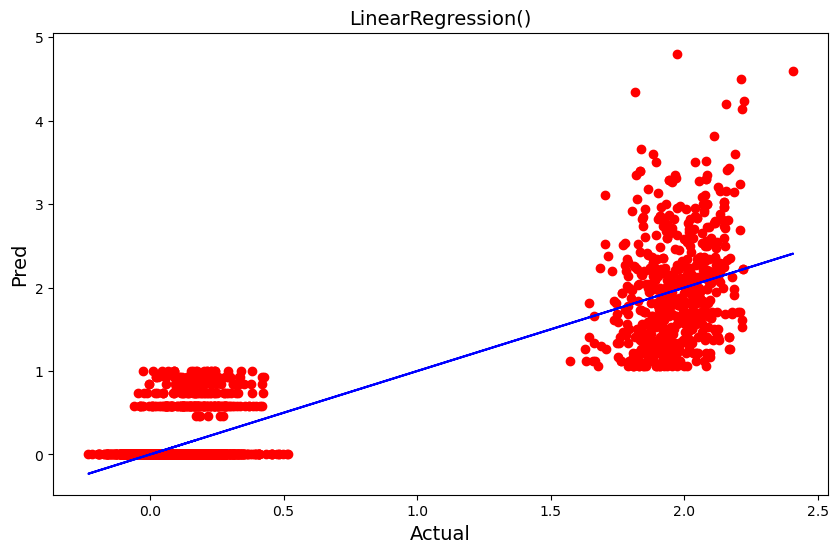

Cross Validation of:   LinearRegression()  is 
[0.77766969 0.76644478 0.78702398 0.79182575 0.83146712]
0.7908862653837575
Diff in Acc Score and Cross Val Score is -  2.061556785151175


R2_score:   RandomForestRegressor()  is  0.8788505555949144
R2_score_Training Data:   RandomForestRegressor()  is  97.69090798765761
error:
Mean Absolute error 0.18329044317079715
Mean Squared error 0.09032252238407343
Root Mean Squared error 0.30053705659048674


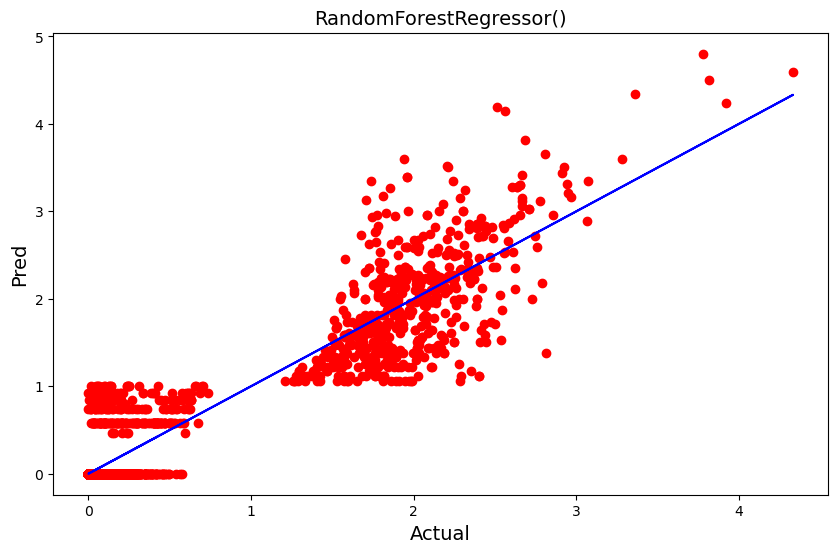

Cross Validation of:   RandomForestRegressor()  is 
[0.78215802 0.82741811 0.88656425 0.84961707 0.8284313 ]
0.834837746924493
Diff in Acc Score and Cross Val Score is -  4.4012808670421455


R2_score:   DecisionTreeRegressor()  is  0.7415690954529075
R2_score_Training Data:   DecisionTreeRegressor()  is  100.0
error:
Mean Absolute error 0.18557166224191496
Mean Squared error 0.19267220972671056
Root Mean Squared error 0.4389444266951234


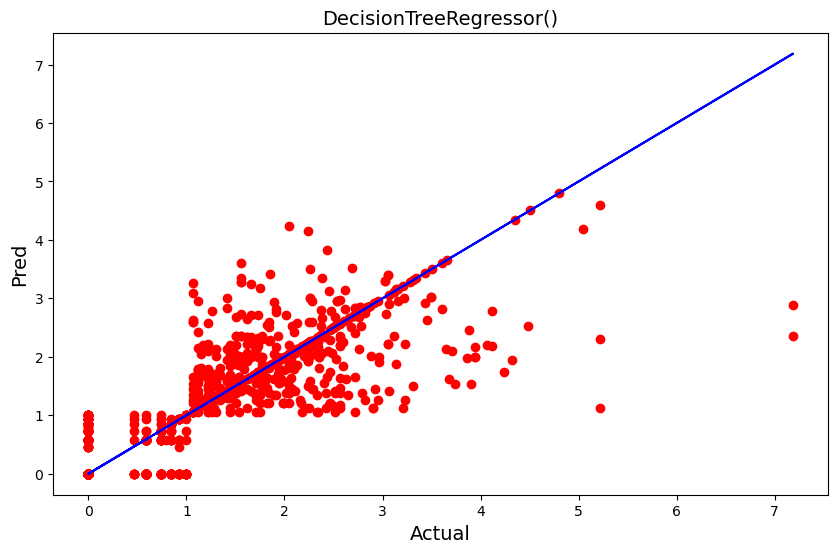

Cross Validation of:   DecisionTreeRegressor()  is 
[0.57871085 0.76040257 0.82389517 0.70508834 0.64068224]
0.7017558347980869
Diff in Acc Score and Cross Val Score is -  3.9813260654820604


R2_score:   KNeighborsRegressor()  is  0.7892529633592998
R2_score_Training Data:   KNeighborsRegressor()  is  83.83881707943412
error:
Mean Absolute error 0.22983934035420955
Mean Squared error 0.15712167751020845
Root Mean Squared error 0.39638576855155694


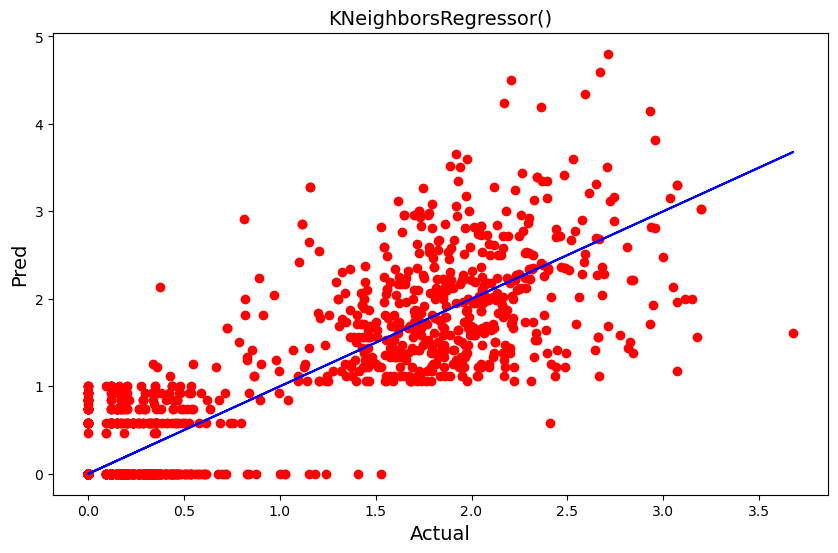

Cross Validation of:   KNeighborsRegressor()  is 
[0.73192912 0.73334053 0.74702712 0.7764621  0.76378022]
0.7505078166206024
Diff in Acc Score and Cross Val Score is -  3.8745146738697445


R2_score:   Lasso()  is  -0.0034034782321341606
R2_score_Training Data:   Lasso()  is  0.0
error:
Mean Absolute error 0.7010421592926852
Mean Squared error 0.748083770156148
Root Mean Squared error 0.8649183603994934


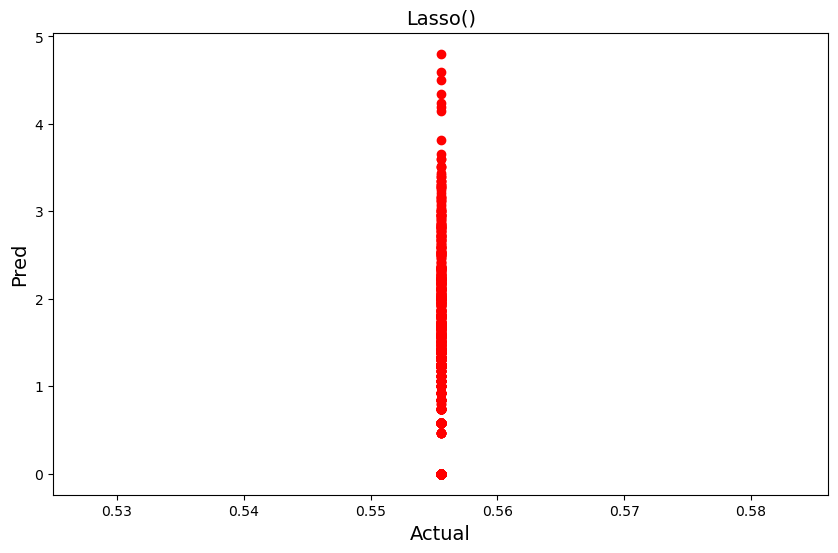

Cross Validation of:   Lasso()  is 
[-0.00199104 -0.00501713 -0.00464031 -0.00026665 -0.03718823]
-0.009820671261019865
Diff in Acc Score and Cross Val Score is -  0.6417193028885705


R2_score:   Ridge()  is  0.811507941300211
R2_score_Training Data:   Ridge()  is  78.66978088195262
error:
Mean Absolute error 0.24733027143692907
Mean Squared error 0.14052956061610386
Root Mean Squared error 0.374872725889873


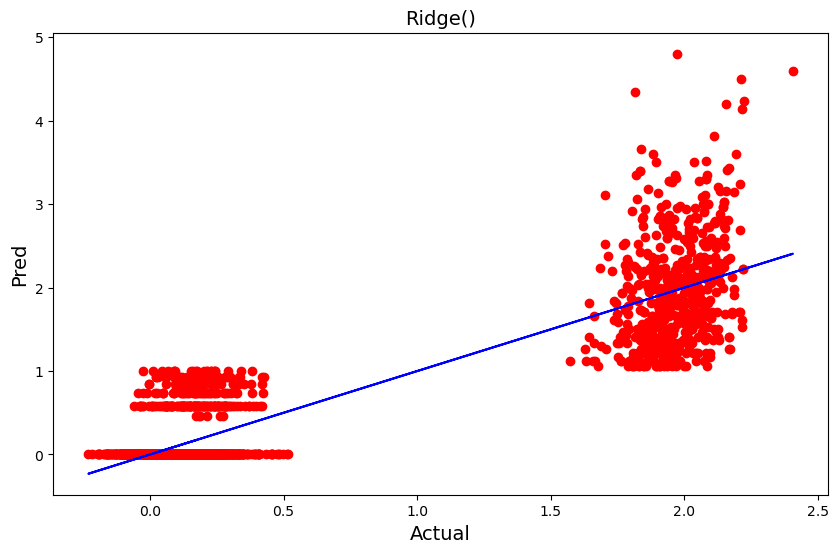

Cross Validation of:   Ridge()  is 
[0.77766563 0.76645792 0.7870133  0.79183675 0.83146613]
0.7908879455533905
Diff in Acc Score and Cross Val Score is -  2.0619995746820496


R2_score:   SVR()  is  0.8237126210942118
R2_score_Training Data:   SVR()  is  85.79122423404115
error:
Mean Absolute error 0.21614781753000017
Mean Squared error 0.13143040651517243
Root Mean Squared error 0.36253331780013326


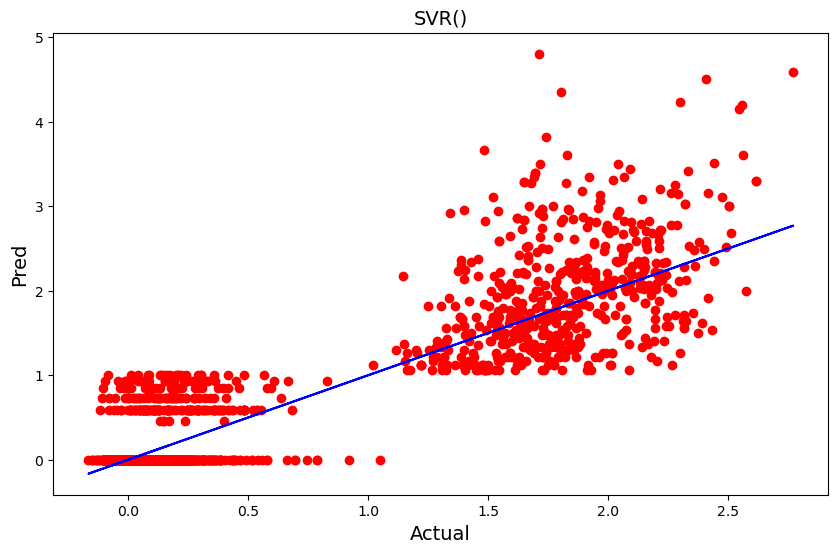

Cross Validation of:   SVR()  is 
[0.75647815 0.78813589 0.8065688  0.81659309 0.81786832]
0.7971288487248805
Diff in Acc Score and Cross Val Score is -  2.6583772369331293


R2_score:   ExtraTreesRegressor()  is  0.8848257748579019
R2_score_Training Data:   ExtraTreesRegressor()  is  100.0
error:
Mean Absolute error 0.1602015507396655
Mean Squared error 0.08586771965442687
Root Mean Squared error 0.29303194306154895


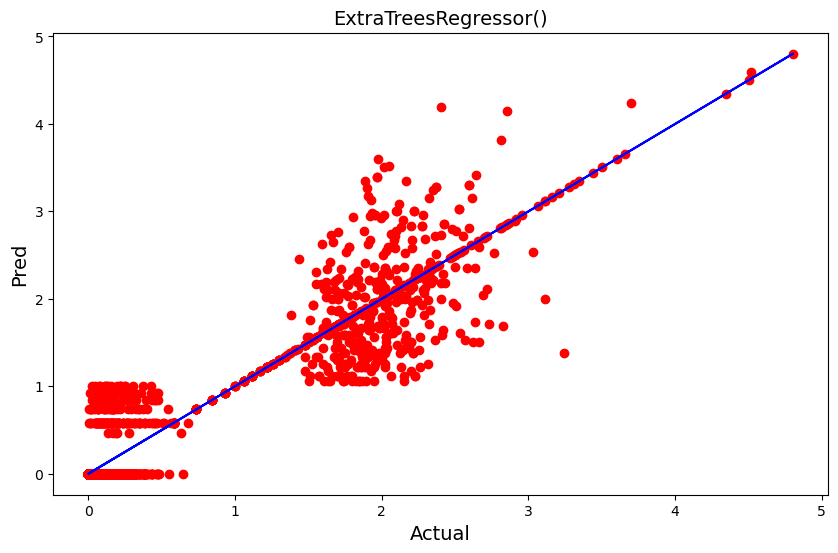

Cross Validation of:   ExtraTreesRegressor()  is 
[0.7872429  0.84155735 0.90582485 0.86071768 0.83059676]
0.8451879087980666
Diff in Acc Score and Cross Val Score is -  3.9637866059835325




In [224]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
#from sklearn.svm import SVC
#from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
#from sklearn.naive_bayes import MultinomialNB
#from sklearn.naive_bayes import GaussianNB


lr= LinearRegression()
rfc=RandomForestRegressor()
dtr=DecisionTreeRegressor()
kn=KNN()
ls=Lasso()
rd=Ridge()
svr=SVR()
etr=ExtraTreesRegressor()




model=[lr,rfc,dtr,kn,ls,rd,svr,etr]

for m in model:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    pred_train=m.predict(x_train)
    
    print("R2_score:  ",m," is " ,r2_score(y_test,predm))
    print("R2_score_Training Data:  ",m," is " ,r2_score(y_train,pred_train)*100)
    print("error:")
    
    print("Mean Absolute error",mean_absolute_error(y_test,predm))
    print("Mean Squared error",mean_squared_error(y_test,predm))
    print("Root Mean Squared error",np.sqrt(mean_squared_error(y_test,predm)))
   
    plt.figure(figsize=(10,6))
    plt.scatter(x=predm,y=y_test,color="r")
    plt.plot(predm,predm,color="b")
    plt.xlabel("Actual",fontsize=14)
    plt.ylabel("Pred",fontsize=14)
    plt.title(m,fontsize=14)
    plt.show()
    score = cross_val_score(m,x,y)
    print("Cross Validation of:  ",m," is " )
    print(score)
    print(score.mean())
    print("Diff in Acc Score and Cross Val Score is - ",(r2_score(y_test,predm)-score.mean())*100)
    print("\n")

# ExtraTreesRegressor is the best model with least error

# 5. Hyper Parameter Tuning

In [226]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}


GCV = GridSearchCV(ExtraTreesRegressor(), param_grid, cv=5)
GCV.fit(x_train, y_train)
print(GCV.best_params_)

{'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}


In [227]:
Final_model = ExtraTreesRegressor(bootstrap = False, max_depth = 20, min_samples_leaf = 2, min_samples_split = 2, n_estimators = 150)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=r2_score(y_test,pred)
print(acc*100)

print("R2_score:",r2_score(y_test,pred))

print("Mean Absolute error",mean_absolute_error(y_test,pred))
print("Mean Squared error",mean_squared_error(y_test,pred))
print("Root Mean Squared error",np.sqrt(mean_squared_error(y_test,pred)))

88.42055769193583
R2_score: 0.8842055769193583
Mean Absolute error 0.17372688010618906
Mean Squared error 0.08633010594486133
Root Mean Squared error 0.29381985287733936
